In [1]:
from matplotlib import pyplot as plt
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.feature import hog
from skimage import data, exposure
from skimage.metrics import mean_squared_error as mse
from skimage.metrics import peak_signal_noise_ratio as psnr
import pandas as pd

In [2]:
def plt_imshow(title, image):
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	plt.imshow(image)
	plt.title(title)
	plt.grid(False)
	plt.show()

1.  Perform edge detection on the given images using the Prewitt, Kirsch, Marr-Hildreth, and
Canny edge detection algorithms. Compare the results obtained by each algorithm,
considering factors such as edge quality, noise suppression.

In [ ]:
def Canny(image):
    img_canny = cv2.Canny(image,100,200)
    return img_canny

In [ ]:
def Prewitt(image):
    kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
    kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
    img_prewittx = cv2.filter2D(image, -1, kernelx)
    img_prewitty = cv2.filter2D(image, -1, kernely)
    img_prewitt = img_prewittx + img_prewitty
    img_prewitt = np.uint8(img_prewitt > 50) * 255
    return img_prewitt

In [ ]:
def Kirsch(image):
    # Kirsch maskes
    kirsch_masks = [
    np.array([[5, 5, 5], [-3, 0, -3], [-3, -3, -3]]),
    np.array([[-3, 5, 5], [-3, 0, 5], [-3, -3, -3]]),
    np.array([[-3, -3, 5], [-3, 0, 5], [-3, -3, 5]]),
    np.array([[-3, -3, -3], [-3, 0, -3], [5, 5, 5]]),
    np.array([[-3, -3, -3], [5, 0, -3], [5, 5, -3]]),
    np.array([[-3, -3, -3], [-3, 0, 5], [-3, 5, 5]]),
    np.array([[5, -3, -3], [5, 0, -3], [5, -3, -3]]),
    np.array([[5, 5, -3], [5, 0, -3], [-3, -3, -3]])
    ]
    # Apply Kirsch masks
    kirsch_responses = [np.abs(cv2.filter2D(image, -1, mask)) for mask in kirsch_masks]
    # Calculate edge strength
    edge_strength = np.max(np.stack(kirsch_responses, axis=-1), axis=-1)
    # Threshold for visualization
    edges = np.uint8(edge_strength > 210) * 255
    return edges


In [ ]:
def Mar_Hildreth(image):
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)

    edges = cv2.morphologyEx(np.uint8(np.abs(laplacian)), cv2.MORPH_CLOSE, np.ones((3, 3)))
    edges = np.uint8(edges > 10) * 255
    return edges

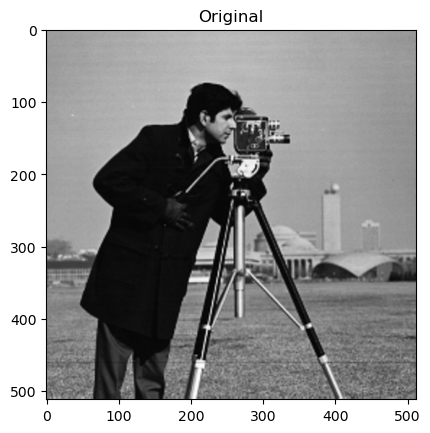

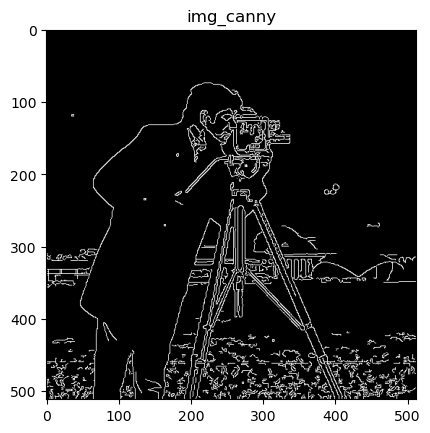

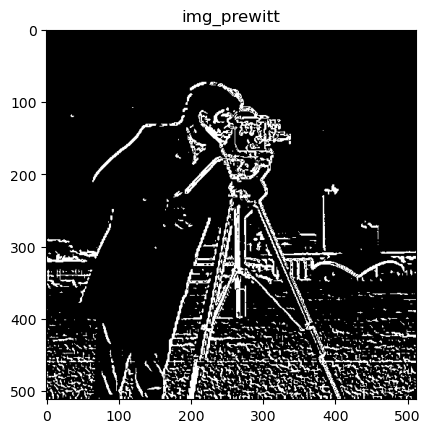

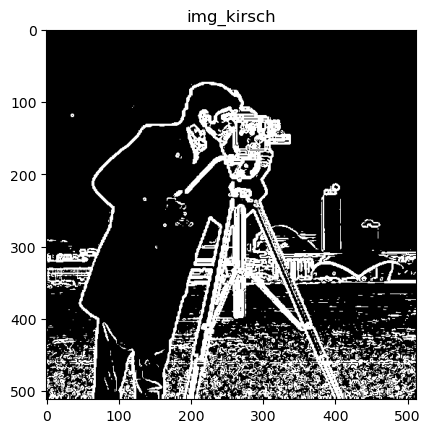

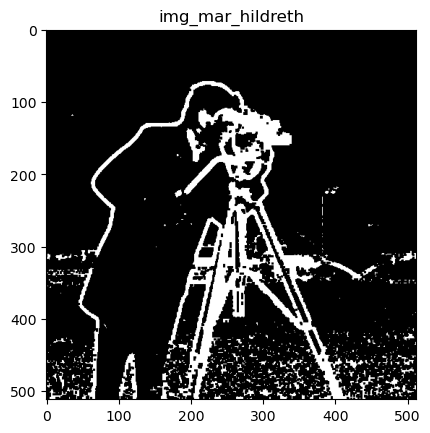

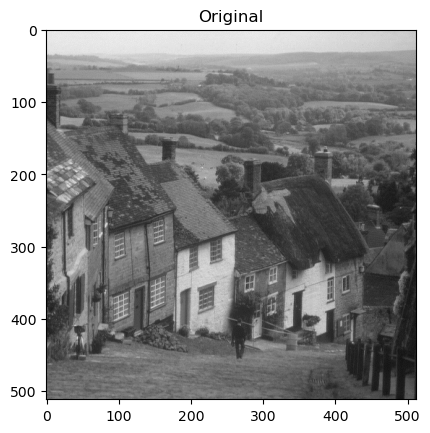

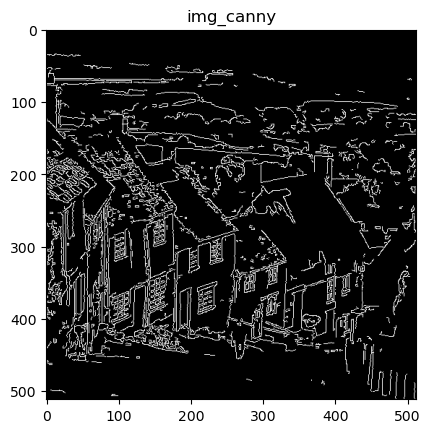

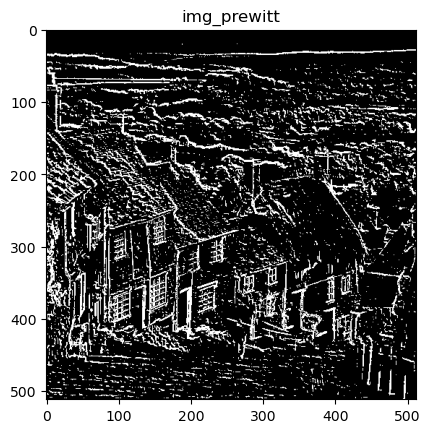

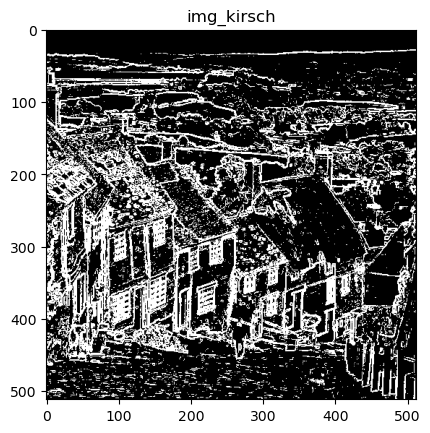

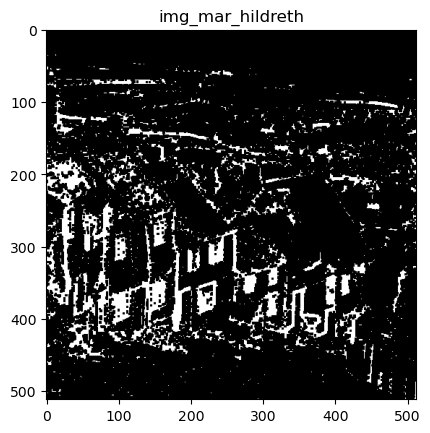

In [ ]:
camera_man_image = cv2.imread("D:/Uni/BCV/Exercise_2/images/1/Camera Man.bmp")
goldhill_image = cv2.imread("D:/Uni/BCV/Exercise_2/images/1/Goldhill.bmp")

plt_imshow("Original", camera_man_image)
image = cv2.cvtColor(camera_man_image, cv2.COLOR_BGR2GRAY)

plt_imshow("img_canny", Canny(image))
plt_imshow("img_prewitt", Prewitt(image))
plt_imshow("img_kirsch", Kirsch(image))
plt_imshow("img_mar_hildreth", Mar_Hildreth(image))



plt_imshow("Original", goldhill_image)
image = cv2.cvtColor(goldhill_image, cv2.COLOR_BGR2GRAY)

plt_imshow("img_canny", Canny(image))
plt_imshow("img_prewitt", Prewitt(image))
plt_imshow("img_kirsch", Kirsch(image))
plt_imshow("img_mar_hildreth", Mar_Hildreth(image))




2. Perform color segmentation on the provided images using 8, 16, and 32 colors. After
segmentation, compare the resulting segmented images with each other to analyze the visual
differences and similarities.

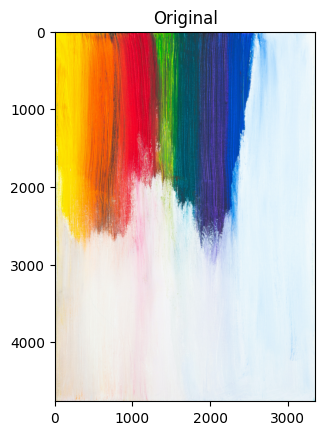

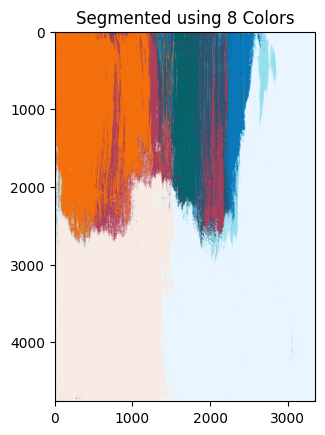

PSNR: 4.533832477386575
MSE: 22892.705064578226


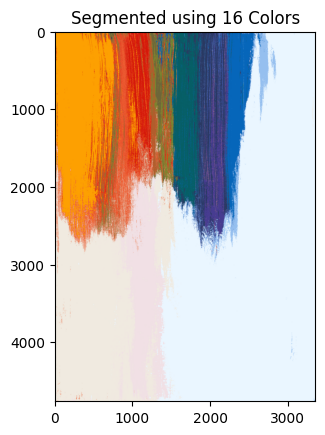

PSNR: 4.595800576472043
MSE: 22568.375712014342


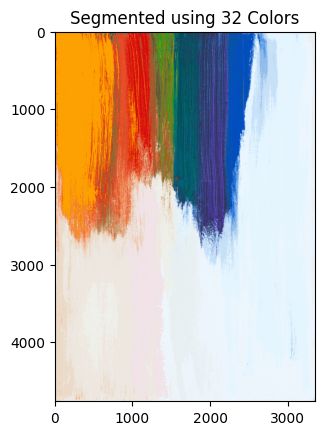

PSNR: 4.640365367916614
MSE: 22337.976209931378


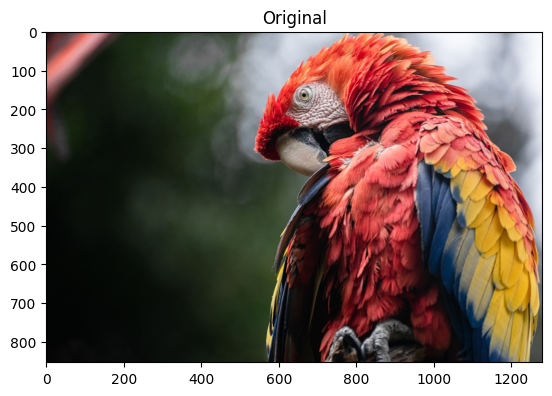

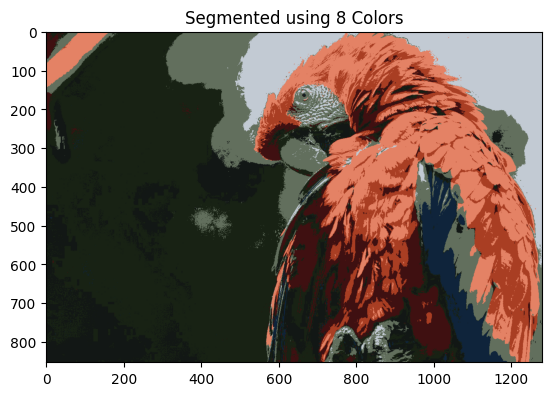

PSNR: 10.267728760129726
MSE: 6113.747311571903


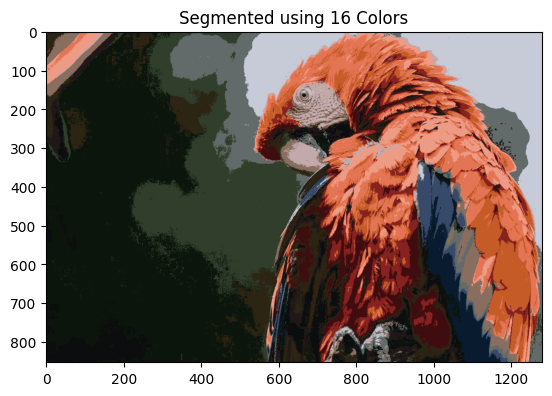

PSNR: 10.248340999955754
MSE: 6141.101293840367


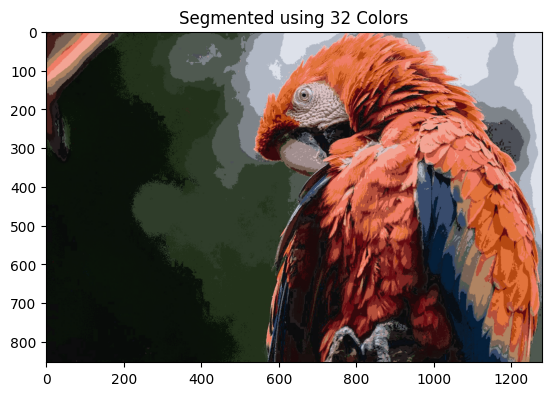

PSNR: 10.218913602382035
MSE: 6182.8541324736225


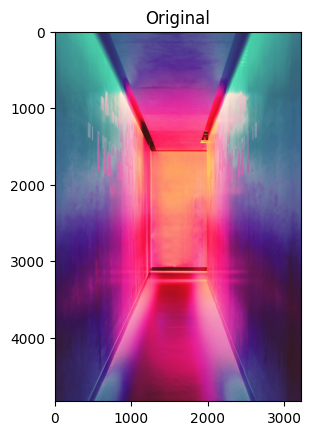

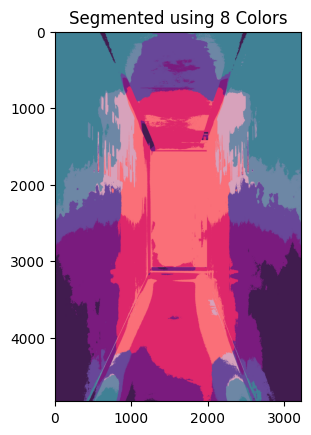

PSNR: 9.613753109455185
MSE: 7107.30658649028


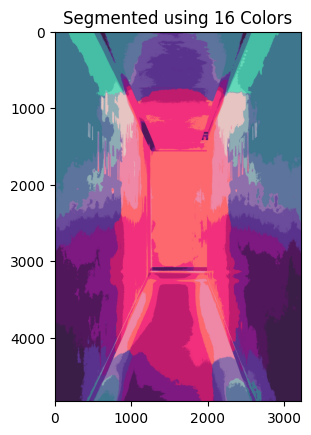

PSNR: 9.55456247533765
MSE: 7204.836227196326


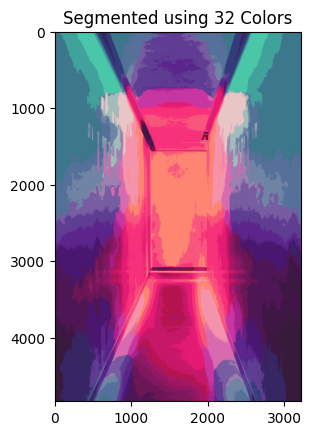

PSNR: 9.476769978991644
MSE: 7335.054802951634


In [4]:
path = "/content/drive/MyDrive/images/2/"
colors = [8, 16, 32]
for i in range(1, 4):
  image_path = path + str(i) + ".jpg"
  image = cv2.imread(image_path)
  height, width, _ = image.shape
  plt_imshow("Original", image)
  img = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
  h = img[:, :, 0]
  s = img[:, :, 1]
  v = img[:, :, 2]
  h_color = h.reshape((-1, 1))
  s_color = s.reshape((-1, 1))
  v_color = v.reshape((-1, 1))
  Z = np.column_stack((h_color, s_color, v_color))
  # Convert Z to float32
  Z = np.float32(Z)
  # Set K-means criteria
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
  for color in colors:
    # Perform K-means clustering
    segmented, label, center = cv2.kmeans(Z, color, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    center = np.uint8(center)
    segmented = center[label.flatten()]
    segmented = segmented.reshape((height, width, 3))[:, :, :3]
    segmented = cv2.cvtColor(segmented, cv2.COLOR_HSV2RGB)
    plt_imshow("Segmented using {} Colors".format(color), segmented)
    print("PSNR: {}".format(psnr(img, segmented)))
    print("MSE: {}".format(mse(img, segmented)))

3. Apply texture-based segmentation to the given images using Gabor filters. Evaluate the
segmentation results by adjusting the parameters of the Gabor filter and comparing the
segmented images.


In [90]:
def texture_segment(image, K):
    image1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    df = pd.DataFrame()
    num = 1
    for theta in range(2):
        thete = theta / 4. *np.pi
        for sigma in (3, 5):
            for lamda in np.arange(0, np.pi, np.pi /4.):
                for gamma in (0.8, 0.9):
                    gabor_label = 'Gabor' + str(num)
                    kernel = cv2.getGaborKernel((3, 3), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)
                    fimage = cv2.filter2D(image1, cv2.CV_8UC3, kernel)
                    filterd_image = fimage.reshape(-1)
                    df[gabor_label] = filterd_image
                    num += 1
            
    features = np.float32(df.to_numpy())
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    segmented, label = cv2.kmeans(features, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    segmented = np.round(label.flatten().reshape((image1.shape[0], image1.shape[1])) * (255 / (K - 1)))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8), sharex=True, sharey=True)
    ax1.axis('off') 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax1.imshow(image)
    ax1.set_title('Original image')
    ax2.axis('off')
    ax2.imshow(segmented, cmap='gray')
    ax2.set_title('Segmented')
    plt.show()

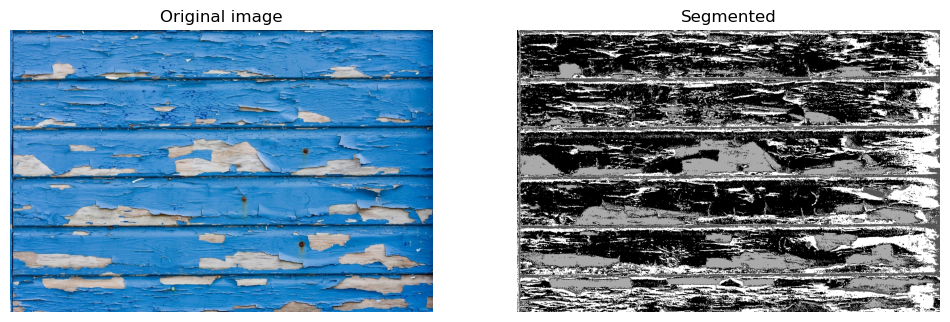

In [93]:
image = cv2.imread("D:/Uni/BCV/Exercise_2/images/3/peeling.jpg")
texture_segment(image, 4)

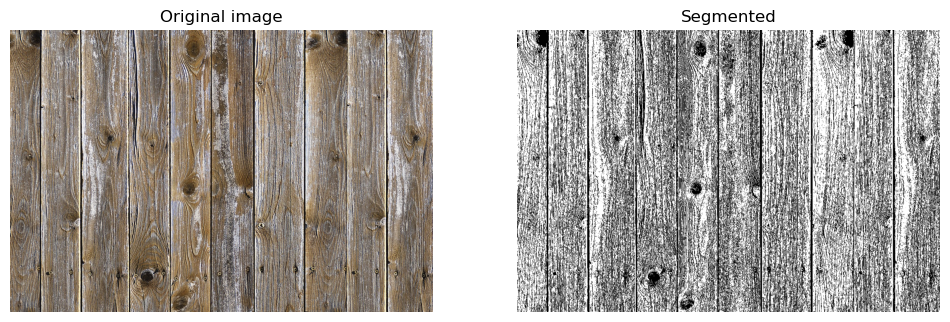

In [96]:
image_wood = cv2.imread("D:/Uni/BCV/Exercise_2/images/3/wood.jpg")
texture_segment(image_wood,3)

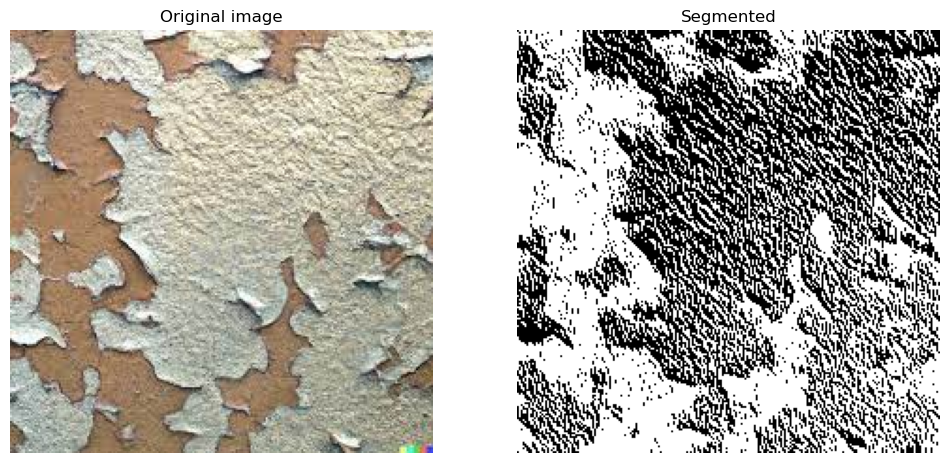

In [88]:
image = cv2.imread("D:/Uni/BCV/Exercise_2/images/3/1.jpg")
texture_segment(image, 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


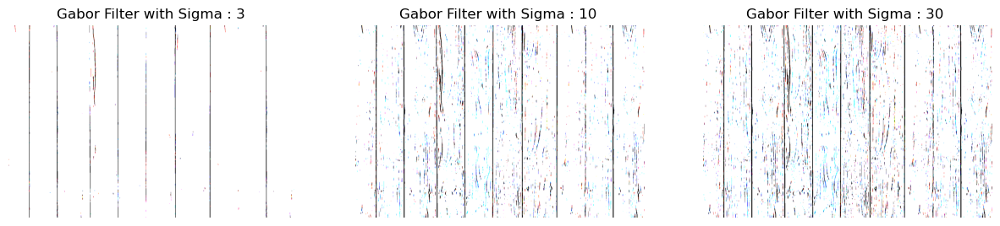

In [80]:
image = cv2.imread("D:/Uni/BCV/Exercise_2/images/3/wood.jpg")
sigmas = [3, 10, 30]
theta = 0
images = []
parameters = []
# Sigma parameter

for sigma in sigmas:
    kernel = cv2.getGaborKernel((9, 9), sigma, theta, 10.0, 0.8, 0, ktype=cv2.CV_64F)
    filtered_image = cv2.filter2D(image, cv2.CV_64F, kernel)
    images.append(filtered_image)
    parameters.append("Gabor Filter with Sigma : {} ".format(sigma))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax1.axis('off') 
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ax1.imshow(images[0], cmap='gray')
ax1.set_title(parameters[0])
ax1.axis('off')
ax2.imshow(images[1], cmap='gray')
ax2.set_title(parameters[1])
ax2.axis('off')
ax3.imshow(images[2], cmap='gray')
ax3.set_title(parameters[2])
ax3.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


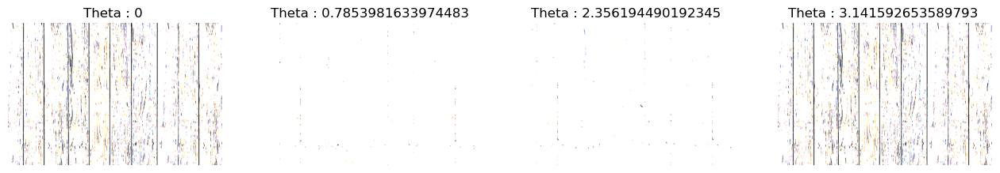

In [81]:
# Theta parameter
sigmas = 10
thetas = [0, np.pi/4, 3*np.pi/4, np.pi]
images = []
parameters = []

for theta in thetas:
    kernel = cv2.getGaborKernel((9, 9), sigma, theta, 10.0, 0.8, 0, ktype=cv2.CV_64F)
    filtered_image = cv2.filter2D(image, cv2.CV_64F, kernel)
    images.append(filtered_image)
    parameters.append("Theta : {} ".format(theta))

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 5), sharex=True, sharey=True)
ax1.axis('off') 
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ax1.imshow(images[0], cmap='gray')
ax1.set_title(parameters[0])
ax1.axis('off')
ax2.imshow(images[1], cmap='gray')
ax2.set_title(parameters[1])
ax2.axis('off')
ax3.imshow(images[2], cmap='gray')
ax3.set_title(parameters[2])
ax3.axis('off')
ax4.imshow(images[3], cmap='gray')
ax4.set_title(parameters[3])
ax4.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


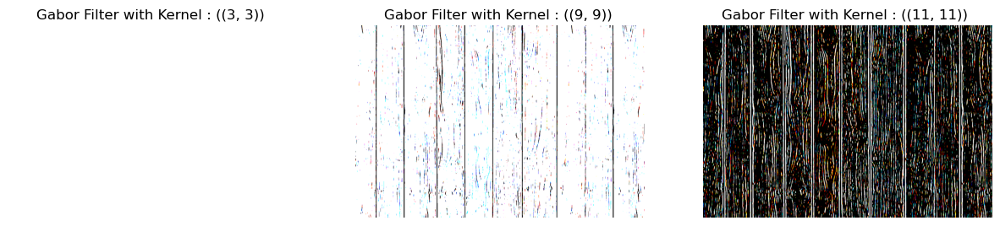

In [82]:
# Kerenl parameter
kernels = [(3, 3), (9, 9), (11, 11)]
sigma = 10
theta = 0

images = []
parameters = []

for size in kernels:
    kernel = cv2.getGaborKernel(size, sigma, theta, 10.0, 0.8, 0, ktype=cv2.CV_64F)
    filtered_image = cv2.filter2D(image, cv2.CV_64F, kernel)
    images.append(filtered_image)
    parameters.append("Gabor Filter with Kernel : ({}) ".format(size))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax1.axis('off') 
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ax1.imshow(images[0], cmap='gray')
ax1.set_title(parameters[0])
ax1.axis('off')
ax2.imshow(images[1], cmap='gray')
ax2.set_title(parameters[1])
ax2.axis('off')
ax3.imshow(images[2], cmap='gray')
ax3.set_title(parameters[2])
ax3.axis('off')
plt.show()

In [ ]:
sigmas = [3, 10, 30]
for sigma in sigmas:
    kernel = cv2.getGaborKernel((9, 9), sigma, theta, 10.0, 0.8, 0, ktype=cv2.CV_64F)
    filtered_image = cv2.filter2D(image, cv2.CV_64F, kernel)
    plt.imshow(filtered_image)
    plt.title("Gabor Filter with Sigma : {} and thata : {}".format(sigma, theta))
    plt.show()

4. Generate and display the Histogram of Oriented Gradients (HOG) images for the given pictures. Evaluate and compare the HOG representations by adjusting parameters and visualizing the resulting images.

In [3]:
def HOG(image, orientation, pixels_per_cell, cells_per_block):
    fd, hog_image = hog(image, orientation, pixels_per_cell,
                    cells_per_block, visualize=True, channel_axis=-1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

    ax1.axis('off')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax1.imshow(image, cmap=plt.cm.gray)
    ax1.set_title('Input image')

    # Rescale histogram for better display
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    ax2.axis('off')
    ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
    ax2.set_title('Histogram of Oriented Gradients')
    plt.show()

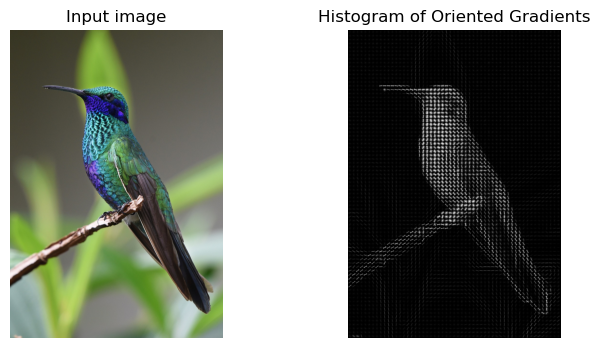

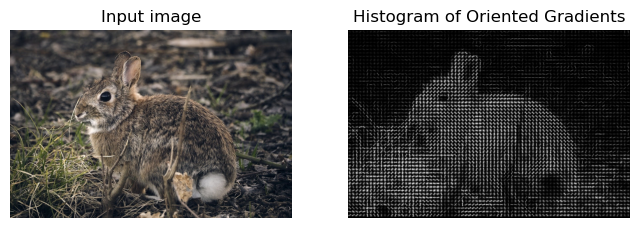

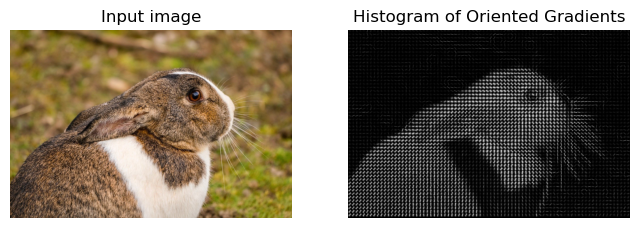

In [9]:
bird_img = cv2.imread("D:/Uni/BCV/Exercise_2/images/4/bird.jpg")
HOG(bird_img, 12, (16, 16), (1, 1))

hare_img = cv2.imread("D:/Uni/BCV/Exercise_2/images/4/hare.jpg")
HOG(hare_img, 12, (16, 16), (1, 1))

rabbit_img = cv2.imread("D:/Uni/BCV/Exercise_2/images/4/rabbit.jpg")
HOG(rabbit_img, 12, (16, 16), (1, 1))

Adjusting orientation

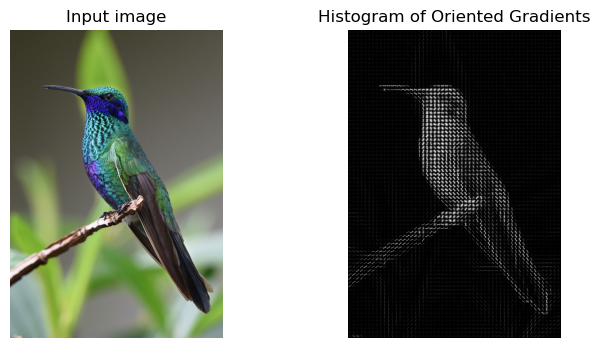

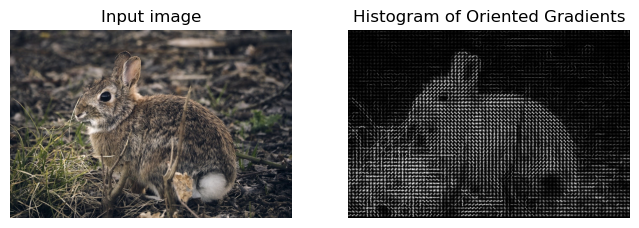

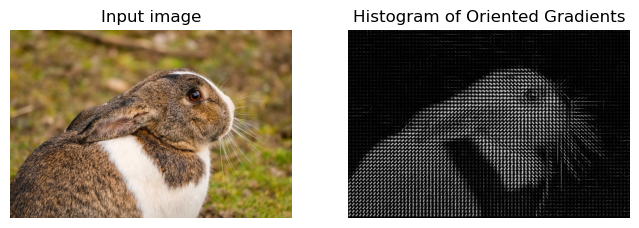

In [6]:
HOG(bird_img, 100, (16, 16), (1, 1))
HOG(hare_img, 100, (16, 16), (1, 1))
HOG(rabbit_img, 100, (16, 16), (1, 1))

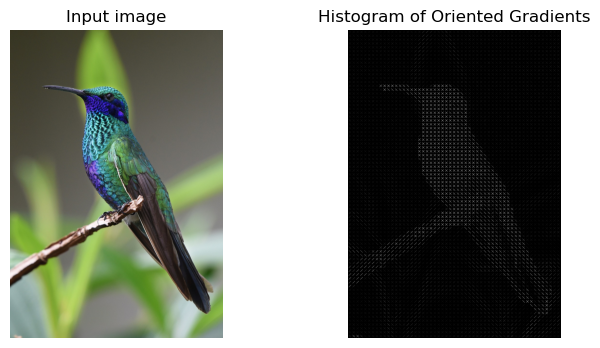

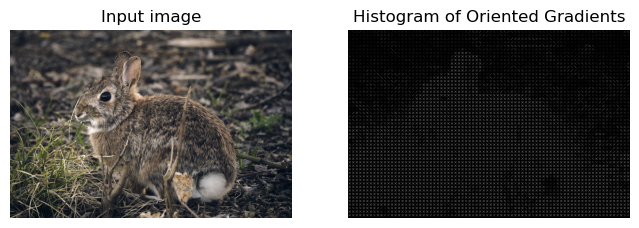

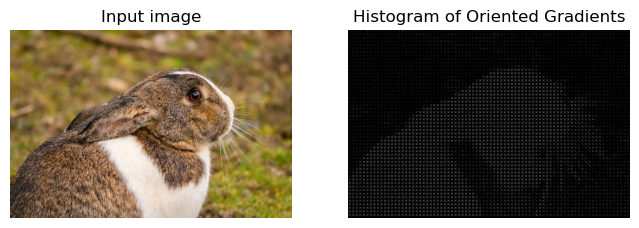

In [12]:
HOG(bird_img, 2, (16, 16), (1, 1))
HOG(hare_img, 2, (16, 16), (1, 1))
HOG(rabbit_img, 2, (16, 16), (1, 1))

Adjusting pixels_per_cell

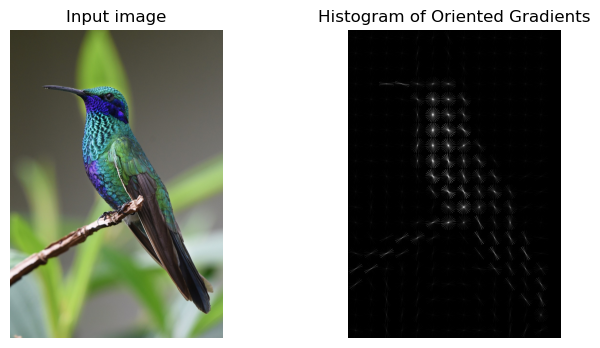

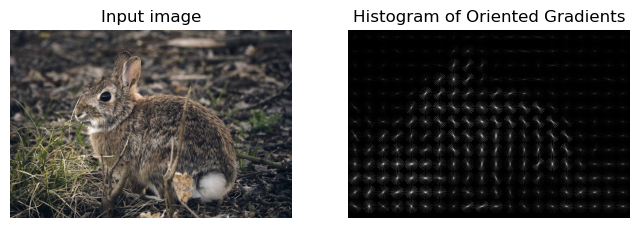

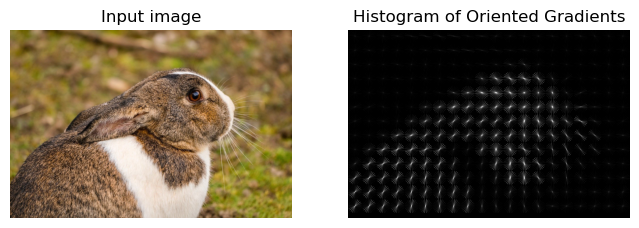

In [17]:
HOG(bird_img, 12, (64, 64), (1, 1))
HOG(hare_img, 12, (64, 64), (1, 1))
HOG(rabbit_img, 12, (64, 64), (1, 1))

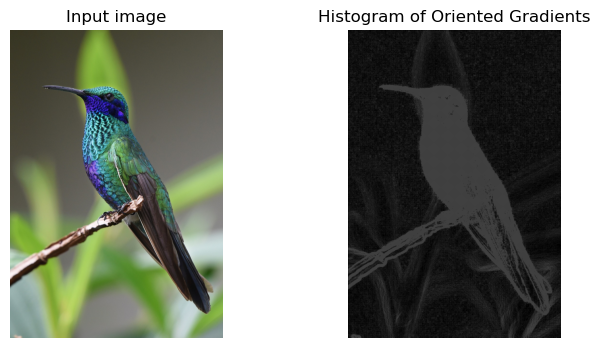

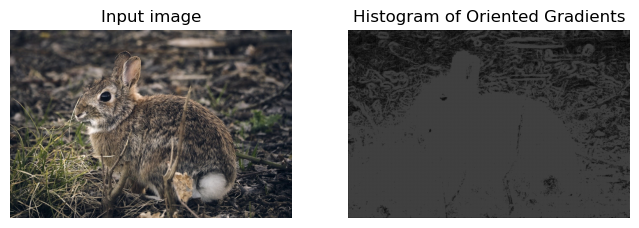

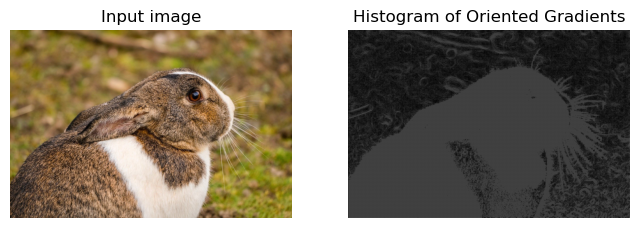

In [16]:
HOG(bird_img, 12, (2, 2), (1, 1))
HOG(hare_img, 12, (2, 2), (1, 1))
HOG(rabbit_img, 12, (2, 2), (1, 1))

Adjusting cells_per_block

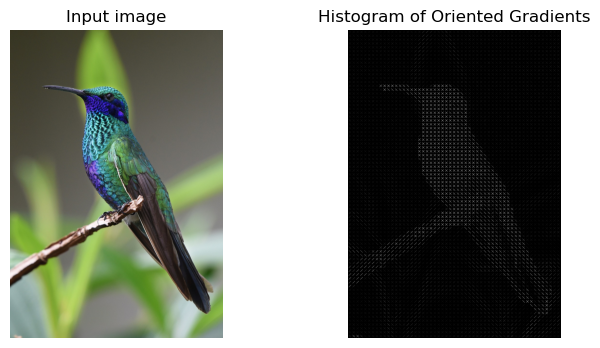

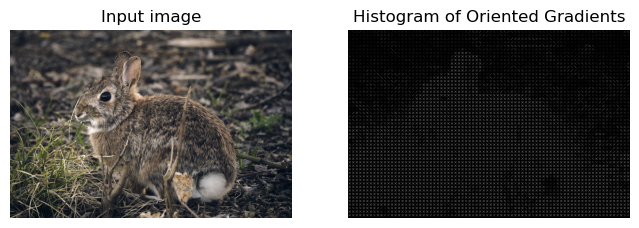

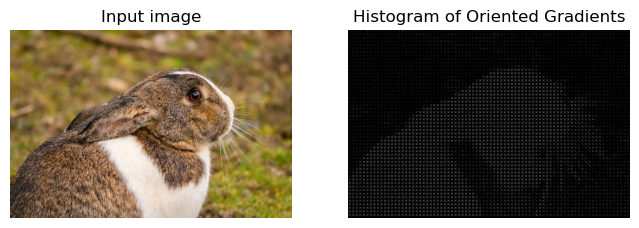

In [18]:
HOG(bird_img, 2, (16, 16), (10, 10))
HOG(hare_img, 2, (16, 16), (10, 10))
HOG(rabbit_img, 2, (16, 16), (10, 10))

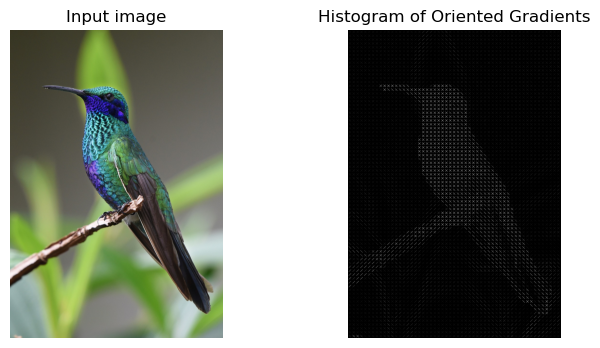

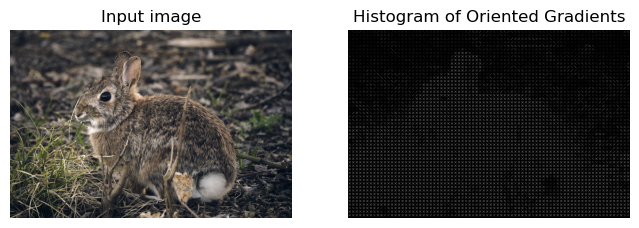

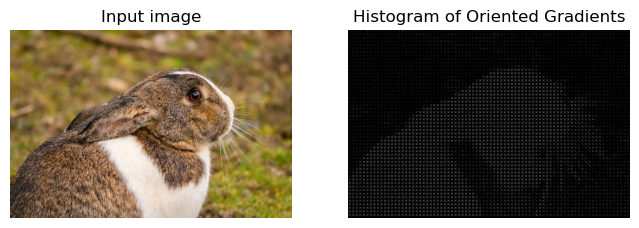

In [21]:
HOG(bird_img, 2, (16, 16), (32, 32))
HOG(hare_img, 2, (16, 16), (32, 32))
HOG(rabbit_img, 2, (16, 16), (32, 32))

5. Utilize the Sift algorithm for scene stitching, showcasing the matching process and creating
panoramic images. Evaluate the effectiveness of the SIFT algorithm by adjusting parameters
and visualizing the stitched panorama images.

In [84]:
def stich_img(img1, img2, sift):
    # find the keypoints and descriptors with SIFT
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    kp1, des1 = sift.detectAndCompute(img1_gray, None)
    kp2, des2 = sift.detectAndCompute(img2_gray,None)

    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des2,des1, k=2)

    # Apply ratio test
    good = []
    for m in matches:
        if m[0].distance < 0.5*m[1].distance:
            good.append(m)
            matches = np.asarray(good)

    if len(matches[:,0]) >= 4:
        src = np.float32([ kp2[m.queryIdx].pt for m in matches[:,0] ]).reshape(-1,1,2)
        dst = np.float32([ kp1[m.trainIdx].pt for m in matches[:,0] ]).reshape(-1,1,2)
        H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
    else:
        raise AssertionError("Can not find enough keypoints.")
    dst = cv2.warpPerspective(img2, H,(img1.shape[1] + img2.shape[1], img1.shape[0]))
    dst[0:img1.shape[0], 0:img1.shape[1]][img1 != 0] = img1[img1 != 0]
    return dst

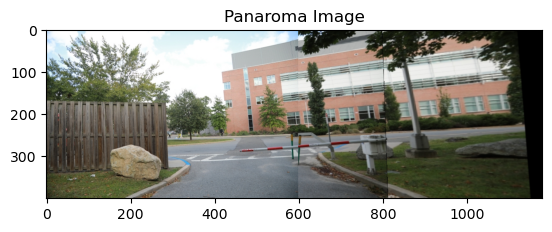

In [85]:
#left
img1 = cv2.imread("D:/Uni/BCV/Exercise_2/images/5/sl.jpg")

#center
img2 = cv2.imread("D:/Uni/BCV/Exercise_2/images/5/sm.jpg")

#right
img4 = cv2.imread("D:/Uni/BCV/Exercise_2/images/5/sr.jpg")

sift = cv2.SIFT_create(nfeatures = 0, nOctaveLayers = 40, contrastThreshold = 0.04, edgeThreshold = 200, sigma = 5,
                       enable_precise_upscale = False)

img3 = stich_img(img1, img2, sift)
final_image = stich_img(img3, img4, sift)
final_image = final_image[0:final_image.shape[0], 0:1180]
plt_imshow("Panaroma Image", final_image)

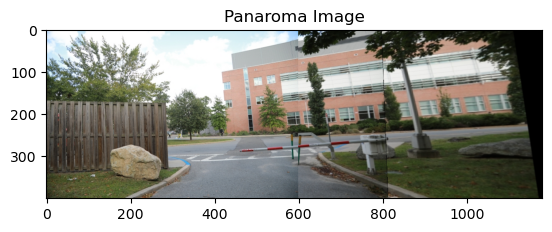

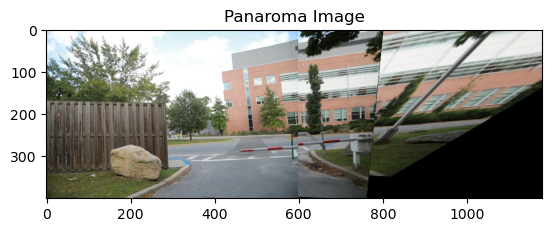

In [114]:
# Sigma = 1
sift = cv2.SIFT_create(nfeatures = 0, nOctaveLayers = 40, contrastThreshold = 0.04, edgeThreshold = 200, sigma = 1,
                       enable_precise_upscale = False)

img3 = stich_img(img1, img2, sift)
final_image = stich_img(img3, img4, sift)
final_image = final_image[0:final_image.shape[0], 0:1180]
plt_imshow("Panaroma Image", final_image)

# Sigma = 25
sift = cv2.SIFT_create(nfeatures = 0, nOctaveLayers = 40, contrastThreshold = 0.04, edgeThreshold = 200, sigma = 25,
                       enable_precise_upscale = False)

img3 = stich_img(img1, img2, sift)
final_image = stich_img(img3, img4, sift)
final_image = final_image[0:final_image.shape[0], 0:1180]
plt_imshow("Panaroma Image", final_image)

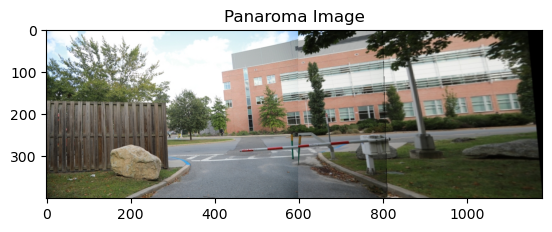

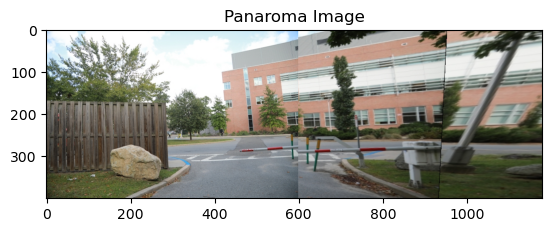

In [125]:
# contrastThreshold = 0.001
sift = cv2.SIFT_create(nfeatures = 0, nOctaveLayers = 40, contrastThreshold = 0.001, edgeThreshold = 200, sigma = 1,
                       enable_precise_upscale = False)

img3 = stich_img(img1, img2, sift)
final_image = stich_img(img3, img4, sift)
final_image = final_image[0:final_image.shape[0], 0:1180]
plt_imshow("Panaroma Image", final_image)

# contrastThreshold =  0.28
sift = cv2.SIFT_create(nfeatures = 0, nOctaveLayers = 40, contrastThreshold = 0.28, edgeThreshold = 200, sigma = 1,
                       enable_precise_upscale = False)

img3 = stich_img(img1, img2, sift)
final_image = stich_img(img3, img4, sift)
final_image = final_image[0:final_image.shape[0], 0:1180]
plt_imshow("Panaroma Image", final_image)